# Imports

In [1]:
!pip install -q segmentation_models_pytorch

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import yaml
import torchvision.models as models
import segmentation_models_pytorch as smp
import gc
from matplotlib import animation
from sklearn.model_selection import KFold

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
import torchvision
import torchvision.transforms as transforms
from torch import Tensor
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Config

In [3]:
%%writefile config.yaml

data_dir: '/kaggle/input/google-research-identify-contrails-reduce-global-warming'
output_dir: 'models'

n_splits: 6
seed: 67
train_folds: [0, 1, 2]#, 3]#[4, 5, 6]#
mix_train_v_validation: False
upsamled: True
epoches: 8
batch_size: 16
normalize_image : True

model:
    segmentation_model: "Unet"
    encoder_name: 'timm-resnest26d'
    encoder_weights: "imagenet"
    in_channels: 3 
    classes: 1
    activation: None

Writing config.yaml


In [4]:
with open("config.yaml", "r") as file:
    config = yaml.safe_load(file)

# Utilites

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [6]:
def get_band_images(idx: str, parrent_folder: str, band: str) -> np.array:
    return np.load(os.path.join(config['data_dir'], parrent_folder, idx, f'band_{band}.npy'))

In [7]:
_T11_BOUNDS = (243, 303)
_CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
_TDIFF_BOUNDS = (-4, 2)

def normalize_range(data, bounds):
    """Maps data to the range [0, 1]."""
    return (data - bounds[0]) / (bounds[1] - bounds[0])


def get_ash_color_images(idx: str, parrent_folder: str, get_mask_frame_only=False, frame_num=4) -> np.array:
    band11 = get_band_images(idx, parrent_folder, '11')
    band14 = get_band_images(idx, parrent_folder, '14')
    band15 = get_band_images(idx, parrent_folder, '15')
    
    if get_mask_frame_only or config['model']['in_channels'] == 3:
        band11 = band11[:,:,frame_num]
        band14 = band14[:,:,frame_num]
        band15 = band15[:,:,frame_num]

    r = normalize_range(band15 - band14, _TDIFF_BOUNDS)
    g = normalize_range(band14 - band11, _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(band14, _T11_BOUNDS)
    false_color = np.clip(np.stack([r, g, b], axis=2), 0, 1)
    return false_color

In [8]:
def get_mask_image(idx: str, parrent_folder: str) -> np.array:
    return np.load(os.path.join(config['data_dir'], parrent_folder, idx, 'human_pixel_masks.npy')) 

# Dataset

In [9]:
#Create a train dataframe
df_train_main = pd.DataFrame({'idx': os.listdir(f'/kaggle/input/google-research-identify-contrails-reduce-global-warming/train'), 'data_set': 'train'})
df_validation_main = pd.DataFrame({'idx': os.listdir(f'/kaggle/input/google-research-identify-contrails-reduce-global-warming/validation'), 'data_set': 'validation'})
if config['mix_train_v_validation']:
    df_train_main = pd.concat([df_train_main, df_validation_main], ignore_index=True)

In [10]:
def get_fold_dataframes(df_main: pd.DataFrame, fold: int, use_val_when_not_mix_train: bool = True) -> tuple[pd.DataFrame, pd.DataFrame]:
    kf = KFold(n_splits=config['n_splits'], random_state=config['seed'], shuffle=True)
    for i, (train_index, test_index) in enumerate(kf.split(df_main)):
        if i == fold:
            _df_train = df_train_main.iloc[train_index]
            _df_test = df_train_main.iloc[test_index]
            if use_val_when_not_mix_train and not config['mix_train_v_validation']:
                _df_test = pd.concat([_df_test, df_validation_main], ignore_index=True)
            return _df_train, _df_test
    raise ValueError(f"Invalid fold was given! Given fold:{fold}, has to be less than {config['n_splits']}! Check config!")        

In [11]:
class ContrailsAshDataset(torch.utils.data.Dataset):
    def __init__(self, df_img_idxs: pd.DataFrame):
        self.df_idx: pd.DataFrame = df_img_idxs
        self.normalize_image = T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
            
    def __len__(self):
        return len(self.df_idx)
    
    def __getitem__(self, idx):
        image_id: str = str(self.df_idx.iloc[idx]['idx'])
        image_parrent_folder = str(self.df_idx.iloc[idx]['data_set'])
        images = torch.tensor(np.reshape(get_ash_color_images(image_id, image_parrent_folder, get_mask_frame_only=False), (256, 256, config['model']['in_channels']))).to(torch.float32).permute(2, 0, 1)
        if config['normalize_image'] and config['model']['in_channels']:
            images = self.normalize_image(images)
        mask = torch.tensor(get_mask_image(image_id, image_parrent_folder)).to(torch.float32).permute(2, 0, 1)
        return images, mask

In [12]:
class ContrailsAshDataset_old(torch.utils.data.Dataset):
    def __init__(self, parrent_folder: str):
        self.df_idx: pd.DataFrame = pd.DataFrame({'idx': os.listdir(f'/kaggle/input/google-research-identify-contrails-reduce-global-warming/{parrent_folder}')})
        self.parrent_folder: str = parrent_folder

    def __len__(self):
        return len(self.df_idx)

    def __getitem__(self, idx):
        image_id: str = str(self.df_idx.iloc[idx]['idx'])
        images = torch.tensor(np.reshape(get_ash_color_images(image_id, self.parrent_folder, get_mask_frame_only=False), (256, 256, config['model']['in_channels']))).to(torch.float32).permute(2, 0, 1)
        mask = torch.tensor(get_mask_image(image_id, self.parrent_folder)).to(torch.float32).permute(2, 0, 1)
        return images, mask

# Model

In [13]:
class Upsampled(nn.Module):
    """
    Simple wrapper to upscale input at runtime, and automatically downscaled it
    """
    def __init__(self, back_bone: nn.Module):
        super(Upsampled, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.back_bone = back_bone
        self.down = nn.Upsample(scale_factor=0.5, mode='bilinear', align_corners=False)

    def forward(self, x):
        # Forward pass through the layers
        x = self.up(x)
        x = self.back_bone(x)
        x = self.down(x)
        return x
    
    def forward_no_downsample_back(self, x):
        # Forward pass through the layers
        x = self.up(x)
        x = self.back_bone(x)
        return x 

In [14]:
def get_model():
    core = smp.Unet(
        encoder_name=config['model']['encoder_name'],
        encoder_weights=config['model']['encoder_weights'],
        in_channels=config['model']['in_channels'],   
        classes=config['model']['classes'],
        activation= None if config['model']['activation'] == 'None' else config['model']['activation']
    )
    if config['upsamled']:
        model = Upsampled(core)
    else:
        model = core
    model.to(device)
    return model

# Trainer

In [15]:
class MyTrainer:
    def __init__(self, model, optimizer, loss_fn, lr_scheduler):
        self.model = model
        self.optimizer = optimizer
        self.loss_fn = loss_fn
        self.lr_scheduler = lr_scheduler
        self._check_optim_net_aligned()
        self.best_iteration = 'none'
        self.min_loss = 999999999 
        
    # Ensures that the given optimizer points to the given model
    def _check_optim_net_aligned(self):
        assert self.optimizer.param_groups[0]['params'] == list(self.model.parameters())
        
    def validate(self, test_dataloader: DataLoader):
        val_loss = 0
        with torch.no_grad():
            self.model.eval()
            
            for i, data in enumerate(test_dataloader):
                # Split data into inputs and target
                inputs, target = data
                # Ensure the data is on correct device 
                inputs = inputs.to(device)#.float()
                target = target.to(device)#.float()
                
                # Compute vlidation loss for this batch
                output = self.model.forward(inputs)
                val_loss += self.loss_fn(output, target).item()
            
        self.model.train()
        return (val_loss / float(len(test_dataloader)))
        
    def fit(self, train_dataloader: DataLoader, test_dataloader: DataLoader, epochs: int = 10, eval_every: int = 1, sub_epoch_eval: int = 10, save_dir:str=''):
        for e in range(epochs):
            # Log training rate
            print("Learning rate: {}".format(self.lr_scheduler.get_last_lr()))
            # Ensures that the model is in train mode for each epoch
            self.model.train()
            
            # Used to keep track of the models loss
            epoch_loss = 0
            sub_epoch_loss = 0
            
            for i, data in enumerate(train_dataloader):
                # Make a sub epoch log
                if i % sub_epoch_eval == 0:
                    print(f'epotch: {e} batch: {i}/{len(train_dataloader)} loss: {sub_epoch_loss / float(sub_epoch_eval)}')
                    sub_epoch_loss = 0
                    
                # Split data into inputs and target
                inputs, target = data
                # Ensure the data is on correct device 
                inputs = inputs.to(device)#.float()
                target = target.to(device)#.float()
            
                # Zeros the gradients for every batch!
                self.optimizer.zero_grad()
                
                # Forward pass
                outputs = self.model.forward(inputs)
                # Compute the loss 
                loss = self.loss_fn(outputs, target)
                # Backwards pass
                loss.backward()
                # Adjust learning paramters
                self.optimizer.step()
                
                # Saves data
                epoch_loss += loss.item()
                sub_epoch_loss += loss.item()
            
            # Adjusts learning rate
            if self.lr_scheduler is not None:
                self.lr_scheduler.step()

            # Reports on epoch
            print('Train Epoch: {} Average Loss: {:.6f}'.format(e, epoch_loss / float(len(train_dataloader))))
            epoch_loss = 0
            
            # Validation
            if e % eval_every == 0:
                # Save a checkpoint
                save_path = os.path.join(save_dir, "model_checkpoint_e" + str(e) + ".pt")
                torch.save(self.model.state_dict(), save_path)
                # Compute validation loss
                val_loss = self.validate(test_dataloader)
                print(f'Validation loss: {val_loss}')
                # Keep track of the best model iteration
                if val_loss < self.min_loss:
                    self.min_loss = val_loss
                    self.best_iteration = save_path
                    print('New best iteration with val loss {:.6f}'.format(val_loss))

# Train

In [16]:
!rm fold_0/model_checkpoint_e0.pt
!rm fold_0/model_checkpoint_e1.pt
!rm fold_0/model_checkpoint_e2.pt
!rm fold_0/model_checkpoint_e3.pt
!rm fold_0/model_checkpoint_e4.pt
!rmdir fold_0

#!rm fold_1/model_checkpoint_e0.pt
#!rm fold_1/model_checkpoint_e1.pt
#!rmdir fold_1

#!rm fold_2/model_checkpoint_e0.pt
#!rm fold_2/model_checkpoint_e1.pt
#!rmdir fold_2

#!rm fold_3/model_checkpoint_e0.pt
#!rm fold_3/model_checkpoint_e1.pt
#!rmdir fold_3

rm: cannot remove 'fold_0/model_checkpoint_e0.pt': No such file or directory
rm: cannot remove 'fold_0/model_checkpoint_e1.pt': No such file or directory
rm: cannot remove 'fold_0/model_checkpoint_e2.pt': No such file or directory
rm: cannot remove 'fold_0/model_checkpoint_e3.pt': No such file or directory
rm: cannot remove 'fold_0/model_checkpoint_e4.pt': No such file or directory
rmdir: failed to remove 'fold_0': No such file or directory


In [17]:
for fold in config['train_folds']:
    print(f'---------------------- Training fold: {fold} ----------------------')
    
    # Create a folder for this fold
    folder_name = 'fold_' + str(fold)
    os.makedirs(folder_name)
    
    # Get the dataloaders
    df_train, df_val = get_fold_dataframes(df_train_main, fold)
    #Makes the dataset to quicly test the training loop
    #df_train = df_train[:(config['batch_size'] * 25)]
    #df_val = df_val[:(config['batch_size'] * 5)]
    dataset_train = ContrailsAshDataset(df_train)
    data_loader_train = DataLoader(dataset_train, batch_size=config['batch_size'], shuffle=True, num_workers=2, drop_last=True)
    dataset_val = ContrailsAshDataset(df_val)
    data_loader_val = DataLoader(dataset_val, batch_size=config['batch_size'], shuffle=False, num_workers=2, drop_last=True)
    
    # Get criterion, optimizer, lr_scheduler and the model to train
    model = get_model()
    criterion = smp.losses.DiceLoss(mode="binary", smooth=1.0)
    optimizer = optim.Adam(model.parameters(), lr=0.0005)
    lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.55) 
    
    # Train the model
    trainer = MyTrainer(model, optimizer, criterion, lr_scheduler)
    trainer.fit(data_loader_train, data_loader_val, epochs=config['epoches'], save_dir=folder_name, sub_epoch_eval=100)
    
    print(f'---------------------- Finished training fold: {fold} ----------------------')
    torch.cuda.empty_cache()
    gc.collect()

---------------------- Training fold: 0 ----------------------


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/gluon_resnest26-50eb607c.pth" to /root/.cache/torch/hub/checkpoints/gluon_resnest26-50eb607c.pth
100%|██████████| 65.3M/65.3M [00:01<00:00, 65.4MB/s]


Learning rate: [0.0005]
epotch: 0 batch: 0/1069 loss: 0.0
epotch: 0 batch: 100/1069 loss: 0.951671102643013
epotch: 0 batch: 200/1069 loss: 0.6487872183322907
epotch: 0 batch: 300/1069 loss: 0.5459644013643264
epotch: 0 batch: 400/1069 loss: 0.496782209277153
epotch: 0 batch: 500/1069 loss: 0.4588145560026169
epotch: 0 batch: 600/1069 loss: 0.44727548837661746
epotch: 0 batch: 700/1069 loss: 0.4484842628240585
epotch: 0 batch: 800/1069 loss: 0.4529711490869522
epotch: 0 batch: 900/1069 loss: 0.4473879289627075
epotch: 0 batch: 1000/1069 loss: 0.46017690300941466
Train Epoch: 0 Average Loss: 0.529760
Validation loss: 0.45421407360436344
New best iteration with val loss 0.454214
Learning rate: [0.000275]
epotch: 1 batch: 0/1069 loss: 0.0
epotch: 1 batch: 100/1069 loss: 0.40531305372715
epotch: 1 batch: 200/1069 loss: 0.42397465944290164
epotch: 1 batch: 300/1069 loss: 0.420056973695755
epotch: 1 batch: 400/1069 loss: 0.4112322843074799
epotch: 1 batch: 500/1069 loss: 0.41630391955375673


# Eval

In [18]:
model = get_model()
model.load_state_dict(torch.load('/kaggle/working/fold_0/model_checkpoint_e4.pt'))
model.eval()
model.to(device)
print()

In [19]:
# Get the dataloader for eval
df_train, df_val = get_fold_dataframes(df_train_main, 0)
dataset_val = ContrailsAshDataset(df_val[:2000])
data_loader_val = DataLoader(dataset_val, batch_size=config['batch_size'], shuffle=False, num_workers=2, drop_last=True)

## Find Optimal Threshold

In [20]:
class Dice(nn.Module):
    def __init__(self, use_sigmoid=True):
        super(Dice, self).__init__()
        self.sigmoid = nn.Sigmoid()
        self.use_sigmoid = use_sigmoid

    def forward(self, inputs, targets, smooth=1):
        if self.use_sigmoid:
            inputs = self.sigmoid(inputs)       
        
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()
        dice = (2.0 *intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return dice

In [21]:
class DiceThresholdTester:
    
    def __init__(self, model: nn.Module, data_loader: torch.utils.data.DataLoader):
        self.model = model
        self.data_loader = data_loader
        self.cumulative_mask_pred = []
        self.cumulative_mask_true = []
        
    def precalculate_prediction(self) -> None:
        self.model.eval()
        with torch.no_grad():
            sigmoid = nn.Sigmoid()

            for images, mask_true in self.data_loader:
                if torch.cuda.is_available():
                    images = images.cuda()

                mask_pred = sigmoid(model.forward(images))

                self.cumulative_mask_pred.append(mask_pred.cpu().detach().numpy())
                self.cumulative_mask_true.append(mask_true.cpu().detach().numpy())

            self.cumulative_mask_pred = np.concatenate(self.cumulative_mask_pred, axis=0)
            self.cumulative_mask_true = np.concatenate(self.cumulative_mask_true, axis=0)

            self.cumulative_mask_pred = torch.flatten(torch.from_numpy(self.cumulative_mask_pred))
            self.cumulative_mask_true = torch.flatten(torch.from_numpy(self.cumulative_mask_true))
            
        torch.cuda.empty_cache()        
        gc.collect()
    
    def test_threshold(self, threshold: float) -> float:
        _dice = Dice(use_sigmoid=False)
        after_threshold = np.zeros(self.cumulative_mask_pred.shape)
        after_threshold[self.cumulative_mask_pred[:] > threshold] = 1
        after_threshold[self.cumulative_mask_pred[:] < threshold] = 0
        after_threshold = torch.flatten(torch.from_numpy(after_threshold))
        return _dice(self.cumulative_mask_true, after_threshold).item()

In [22]:
optim_threshold = 0.02

In [23]:
find_opt_t = False
if find_opt_t:
    dice_threshold_tester = DiceThresholdTester(model, data_loader_val)
    dice_threshold_tester.precalculate_prediction()
if find_opt_t:
    thresholds_to_test = [round(x * 0.01, 2) for x in range(101)]

    optim_threshold = 0.05
    best_dice_score = -1

    thresholds = []
    dice_scores = []

    for t in thresholds_to_test:
        dice_score = dice_threshold_tester.test_threshold(t)
        if dice_score > best_dice_score:
            best_dice_score = dice_score
            optim_threshold = t

        thresholds.append(t)
        dice_scores.append(dice_score)

    print(f'Best Threshold: {optim_threshold} with dice: {best_dice_score}')
    df_threshold_data = pd.DataFrame({'Threshold': thresholds, 'Dice Score': dice_scores})
    
    sns.lineplot(data=df_threshold_data, x='Threshold', y='Dice Score')
    plt.axhline(y=best_dice_score, color='green')
    plt.axvline(x=optim_threshold, color='green')
    plt.text(-0.02, best_dice_score * 0.96, f'{best_dice_score:.3f}', va='center', ha='left', color='green')
    plt.text(optim_threshold - 0.01, 0.02, f'{optim_threshold}', va='center', ha='right', color='green')
    plt.ylim(bottom=0)
    plt.title('Threshold vs Dice Score')
    plt.show()

# Preview Predictions

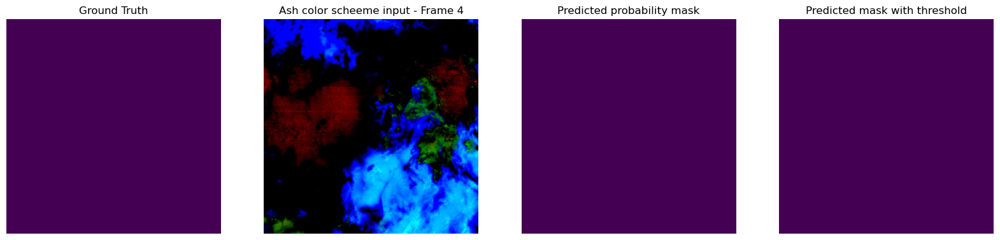

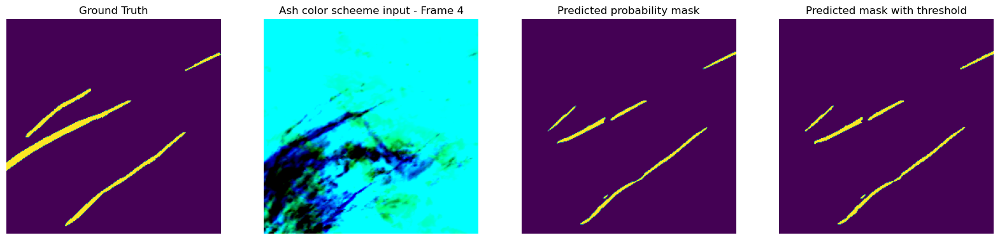

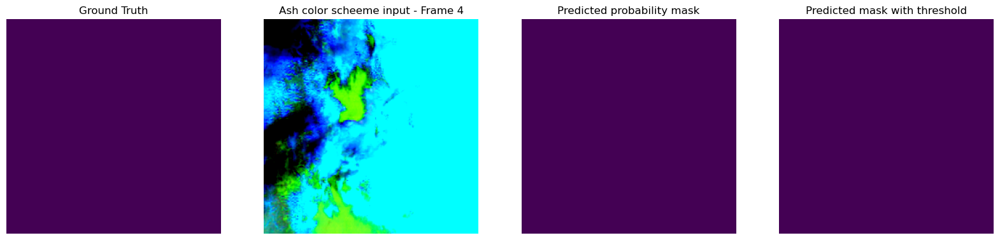

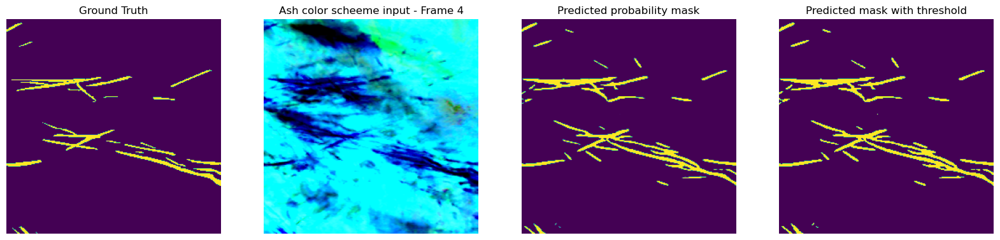

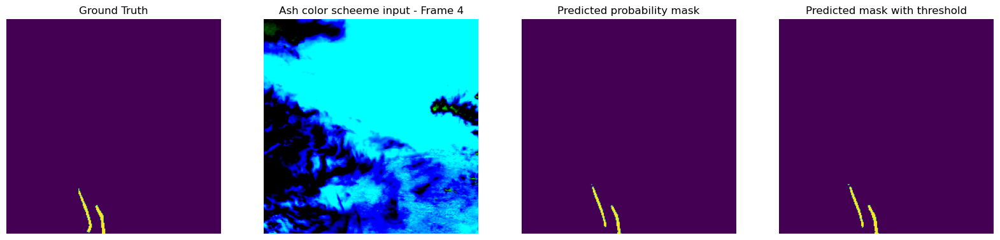

...

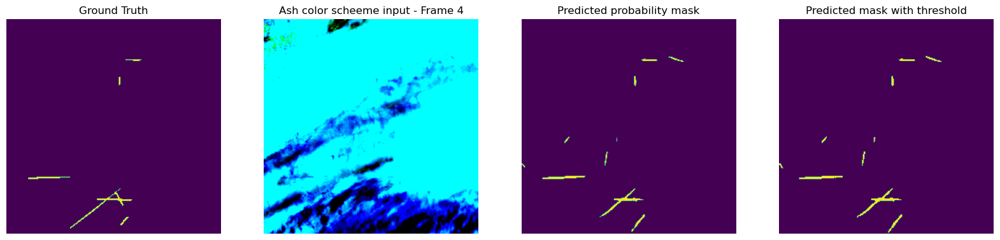

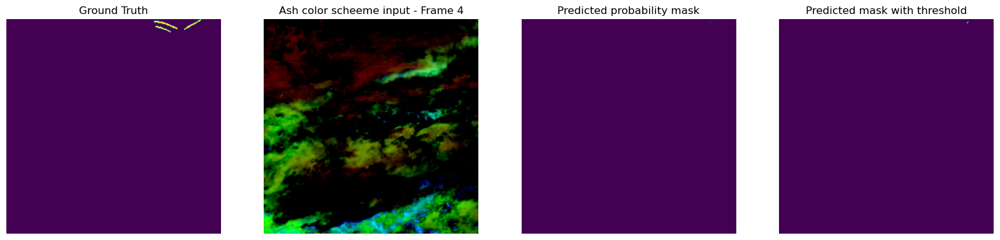

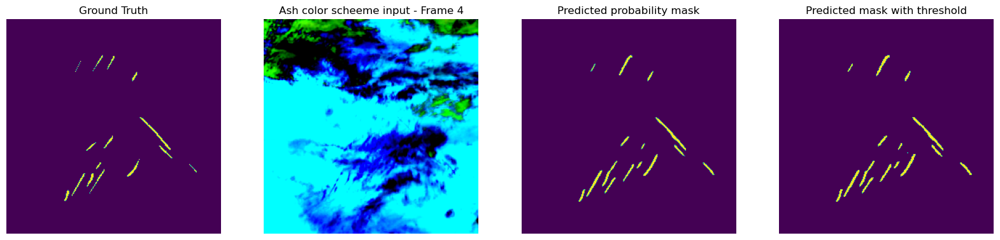

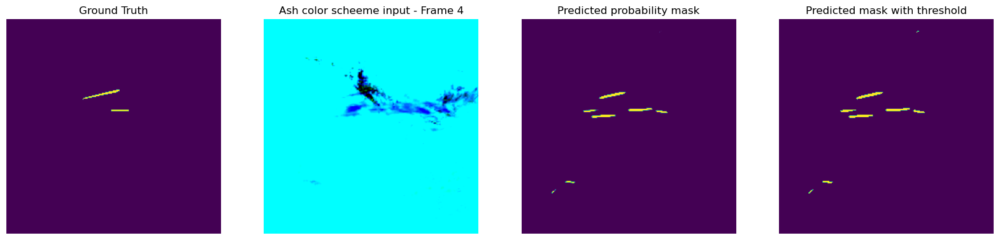

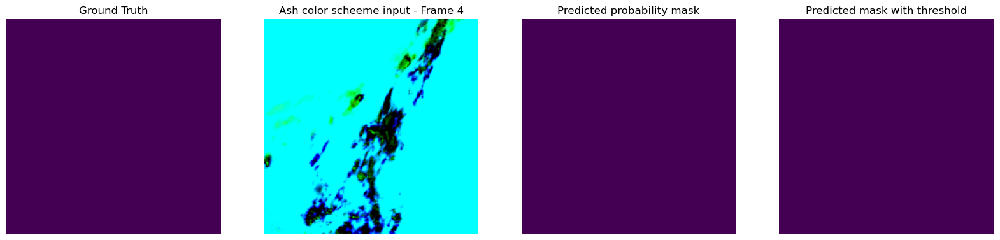

101230

In [24]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

batches_to_show = 4
model.eval()

for i, data in enumerate(data_loader_val):
    images, mask = data
    
    # Predict mask for this instance
    if torch.cuda.is_available():
        images = images.cuda()
    predicated_mask = sigmoid(model.forward(images[:, :, :, :]).cpu().detach().numpy())
    
    # Apply threshold
    predicated_mask_with_threshold = np.zeros((images.shape[0], 256, 256))
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] < optim_threshold] = 0
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] > optim_threshold] = 1
    
    images = images.cpu()
        
    for img_num in range(0, images.shape[0]):
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,10))
        axes = axes.flatten()
        
        # Show groud trought 
        axes[0].imshow(mask[img_num, 0, :, :])
        axes[0].axis('off')
        axes[0].set_title('Ground Truth')
        
        # Show ash color scheme input image
        if config['model']['in_channels'] == 24:
            axes[1].imshow( np.concatenate(
                (
                np.expand_dims(images[img_num, 4, :, :], axis=2),
                np.expand_dims(images[img_num, 12, :, :], axis=2),
                np.expand_dims(images[img_num, 20, :, :], axis=2)
            ), axis=2))
        else:
            axes[1].imshow(images[img_num, :, :, :].permute(1, 2, 0))
        axes[1].axis('off')
        axes[1].set_title('Ash color scheeme input - Frame 4')

        # Show predicted mask
        axes[2].imshow(predicated_mask[img_num, 0, :, :], vmin=0, vmax=1)
        axes[2].axis('off')
        axes[2].set_title('Predicted probability mask')

        # Show predicted mask after threshold
        axes[3].imshow(predicated_mask_with_threshold[img_num, :, :])
        axes[3].axis('off')
        axes[3].set_title('Predicted mask with threshold')
        plt.show()
    
    if i + 1 >= batches_to_show:
        break
torch.cuda.empty_cache()        
gc.collect()